# Exploratory Data Analysis
In this notebook, the wrangled data is imported along with a number of python packages to help visualize the data
### Import relevant packages

In [1]:
import numpy as np
import pandas as pd
from glob import glob
import matplotlib.pyplot as plt
import folium
import branca
import json

### Abstracting the folium interface to suit mapping a series of US County values

In [2]:
#series is a pandas series with fips code index and values for map coloring
def county_map(series, map_tiles='cartodbpositron', color="YlOrRd", caption="Legend", steps=6):
    
            
    series_max = series.quantile(.99)
    series_min = series.quantile(.01)
    

    def style_function(feature):
        map_series = series.get(int(feature['id'][-5:]), None)
        return {
            'fillOpacity': 0.5,
            'weight': 0,
            'fillColor': '#ffffff' if map_series is None 
            else getattr(branca.colormap.linear, color).scale(series_min, series_max)(map_series)
        }

    m = folium.Map(
    location=[48, -102],
    tiles=map_tiles,
    zoom_start=3
    )

    folium.TopoJson(
        open("data/maps/us_counties_20m_topo.json"),
        'objects.us_counties_20m',
        style_function=style_function
    ).add_to(m)
    
    legend = getattr(branca.colormap.linear, color).scale(series_min, series_max)
    legend.caption = caption
    m.add_child(legend)

    return m

## Exploring the Business data
How many business establishments are there in the US? Where are they? What industries are most prevalent?

In [3]:
biz = pd.read_csv("data/interim/establishments.csv", encoding="latin-1")
biz["sum"] = biz.drop("year", axis=1).drop("geo_id", axis=1).sum(axis=1)

employees = pd.read_csv("data/interim/employees.csv", encoding="latin-1")
employees["sum"] = employees.drop("year", axis=1).drop("geo_id", axis=1).sum(axis=1)

### Establishments in America, 2015
In 2015, some large counties have so many more establishments that the map is not very useful

In [4]:
biz15 = biz[biz["year"] == 2015].drop("year", 1).set_index("geo_id")
county_map(biz15["sum"], caption="Number of Establishments")

A box plot shows that most counties have very few establishments, and a few dozen have an extraordinary quantity

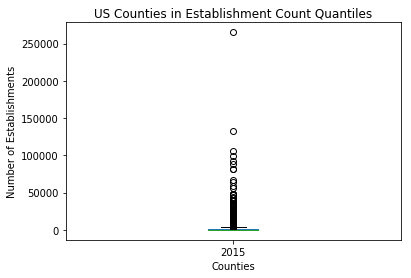

In [5]:
biz15["sum"].plot(kind="box", label="2015")
plt.title("US Counties in Establishment Count Quantiles")
plt.xlabel('Counties')
plt.ylabel("Number of Establishments")
plt.show()

In [85]:
b15e = biz15.set_index("geo_id")

In [88]:
b15e[b15e > 500]

[          sum
 geo_id       
 1001     True
 1003     True
 1005    False
 1007    False
 1009     True
 1011    False
 1013    False
 1015     True
 1017     True
 1019    False
 1021     True
 1023    False
 1025     True
 1027    False
 1029    False
 1031     True
 1033     True
 1035    False
 1037    False
 1039     True
 1041    False
 1043     True
 1045     True
 1047     True
 1049     True
 1051     True
 1053     True
 1055     True
 1057    False
 1059     True
 ...       ...
 55129    True
 55131    True
 55133    True
 55135    True
 55137   False
 55139    True
 55141    True
 56001    True
 56003   False
 56005    True
 56007    True
 56009   False
 56011   False
 56013    True
 56015   False
 56017   False
 56019   False
 56021    True
 56023    True
 56025    True
 56027   False
 56029    True
 56031   False
 56033    True
 56035   False
 56037    True
 56039    True
 56041    True
 56043   False
 56045   False
 
 [3142 rows x 1 columns]]

A histogram provides a better look into the distribution of county-establishment-counts

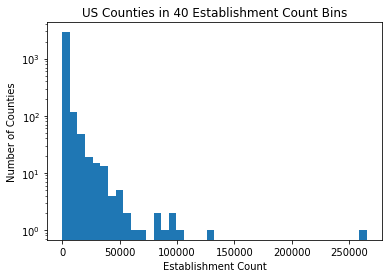

In [6]:
biz15["sum"].plot(kind="hist", bins=40, log=True)
plt.title("US Counties in 40 Establishment Count Bins")
plt.xlabel('Establishment Count')
plt.ylabel("Number of Counties")
plt.show()

### US Business Trends

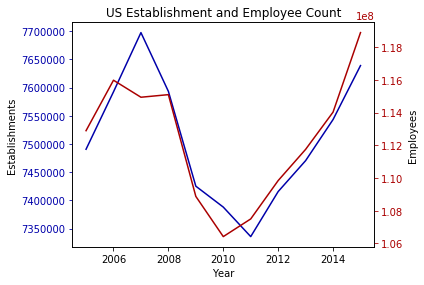

In [47]:
fig, ax1 = plt.subplots()

t = range(2005,2016)

s1 = biz.groupby("year").sum()["sum"]
s2 = employees.groupby("year").sum()["sum"]

ax1.plot(t, s1, "#0000aa")
ax1.set_xlabel("Year")

ax1.set_ylabel("Establishments")
ax1.tick_params('y', colors='#0000aa')

ax2 = ax1.twinx()
ax2.plot(t, s2, "#aa0000")
ax2.set_ylabel('Employees')
ax2.tick_params('y', colors='#aa0000')

fig.tight_layout()

plt.title("US Establishment and Employee Count")
plt.show()

In [62]:
employees.groupby("year").sum()["sum"][2006] - employees.groupby("year").sum()["sum"][2010]

9560937

Industries have shifted over 10 years

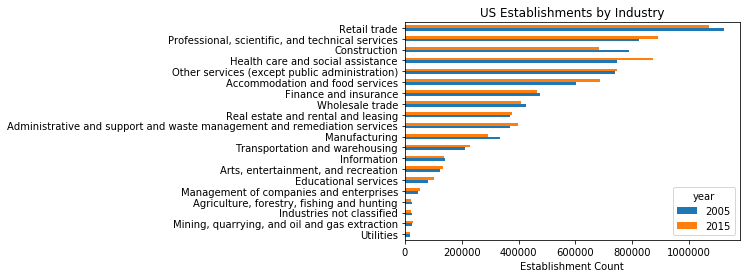

In [8]:
biz.groupby("year").sum().drop("geo_id", 1).drop("sum", 1).transpose().loc[:,[2005,2015]].sort_values(by=2005).plot(kind="barh")
plt.title("US Establishments by Industry")
plt.xlabel('Establishment Count')

plt.show()

In [67]:
biz.groupby("year").sum().drop("geo_id", 1).drop("sum", 1).transpose().loc[:,[2005,2015]].sort_values(by=2005)

year,2005,2015
Utilities,17300,17917
"Mining, quarrying, and oil and gas extraction",23313,28442
Industries not classified,23987,20361
"Agriculture, forestry, fishing and hunting",24084,22335
Management of companies and enterprises,47424,53466
Educational services,80439,101619
"Arts, entertainment, and recreation",121775,133571
Information,140961,137681
Transportation and warehousing,211058,228197
Manufacturing,333450,292819


### Examining trends in recession and recovery
The cardinal values show that urban areas have more business establishments. That's not unexpected. Let's look at how the number of establishments changes in each county

Slicing establishment data for each peak and trough. A recession from 2007 to 2011 interrupts business growth

In [9]:
biz05 = biz[biz["year"] == 2005].drop("year", 1).set_index("geo_id")
biz07 = biz[biz["year"] == 2007].drop("year", 1).set_index("geo_id")
biz11 = biz[biz["year"] == 2011].drop("year", 1).set_index("geo_id")
biz15 = biz[biz["year"] == 2015].drop("year", 1).set_index("geo_id")

These three formulas calculate the compound growth rate from 2005-2015, from 2007-2011, and from 2011-2015, representing the entire data set, the recession, and the subsequent recovery, respectively.

In [10]:
biz_compound = ((biz15["sum"] / biz05["sum"]) ** (1/10) - 1) * 100
recovery_rate = ((biz15["sum"] / biz11["sum"]) ** (1/4) - 1) * 100
recession_rate = ((biz11["sum"] / biz07["sum"]) ** (1/4) - 1) * 100
#the recession has some extreme behavior. value == 1 breaks boxplots and value == -1 is just too far
recession_rate = recession_rate[recession_rate < 100][recession_rate > -100]

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:57: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return getattr(obj, method)(*args, **kwds)


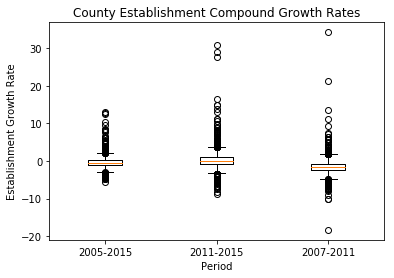

In [11]:
plt.boxplot([biz_compound,recovery_rate,recession_rate], labels=["2005-2015", "2011-2015", "2007-2011"])

plt.title("County Establishment Compound Growth Rates")
plt.xlabel('Period')
plt.ylabel("Establishment Growth Rate")

plt.show()

In [80]:
recovery_rate[recovery_rate < -7]

geo_id
29093   -8.760991
30069   -7.460882
32009   -8.339319
46041   -7.161882
Name: sum, dtype: float64

In [77]:
recession_rate[recession_rate < -7.5]

geo_id
13165    -9.014432
13197    -7.504277
13289    -7.528801
13301    -7.870659
31117   -18.350342
31165   -10.134943
40057    -7.611475
49031    -9.994856
Name: sum, dtype: float64

Visualizing these distributions on maps

In [12]:
county_map(biz_compound, color="RdYlGn", caption="Compound rate of establishment growth from 2005-2015")

In [13]:
#zeroing all positive values in the recession
county_map((-1 * recession_rate[recession_rate < 0].fillna(0)), color="OrRd", caption="Compound rate of establishment shrinkage from 2007-2011")

In [14]:
#zeroing all negative values in the recovery
county_map(recovery_rate[recovery_rate > 0].fillna(0), color="YlGn", caption="Compound rate of establishment growth from 2007-2011")

In [15]:
national05 = biz[biz["year"] == 2005].groupby("year").sum().drop("geo_id", 1).drop("sum", 1)
national15 = biz[biz["year"] == 2015].groupby("year").sum().drop("geo_id", 1).drop("sum", 1)

## Exploring the Migration Data
How many people move? How many people stay? Where do they go? Where do they leave?

In [16]:
exemptions_in = pd.read_csv("data/interim/exemptions_inflow.csv", encoding="latin-1")
exemptions_in["sum"] = exemptions_in.drop(["year", "geo_id"], axis=1).sum(axis=1)
exemptions_in["home"] = exemptions_in.drop(["year","sum", "geo_id"], axis=1).max(axis=1)
exemptions_in["immigrants"] = exemptions_in["sum"] - exemptions_in["home"]

### US Trends

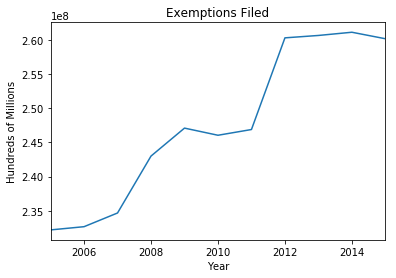

In [17]:
exemptions_in.groupby("year").sum()["sum"].plot()

plt.ylabel('Hundreds of Millions')
plt.xlabel('Year')
plt.title('Exemptions Filed')

plt.show()

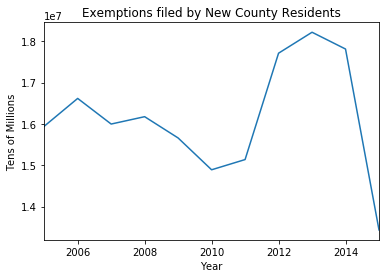

In [18]:
exemptions_in.groupby("year").sum()["immigrants"].plot()

plt.ylabel('Tens of Millions')
plt.xlabel('Year')
plt.title('Exemptions filed by New County Residents')

plt.show()

About the same number of people move out as in. This data does include immigrants from outside the 50 states

In [19]:
exemptions_out = pd.read_csv("data/interim/exemptions_outflow.csv", encoding="latin-1")
exemptions_out["sum"] = exemptions_out.drop("year", axis=1).drop("geo_id", axis=1).sum(axis=1)
exemptions_out["home"] = exemptions_out.drop(["year","sum", "geo_id"], axis=1).max(axis=1)
exemptions_out["emigrants"] = exemptions_out["sum"] - exemptions_in["home"]

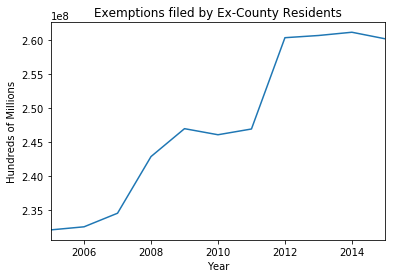

In [20]:
exemptions_out.groupby("year").sum()["sum"].plot()
plt.ylabel('Hundreds of Millions')
plt.xlabel('Year')
plt.title('Exemptions filed by Ex-County Residents')

plt.show()

A tax filing can be considered a household or family. What percent of families moved to new counties?

In [21]:
returns_in = pd.read_csv("data/interim/returns_inflow.csv", encoding="latin-1")
returns_in["sum"] = returns_in.drop(["year", "geo_id"], axis=1).sum(axis=1)
returns_in["home"] = returns_in.drop(["year","sum", "geo_id"], axis=1).max(axis=1)
returns_in["immigrants"] = returns_in["sum"] - returns_in["home"]

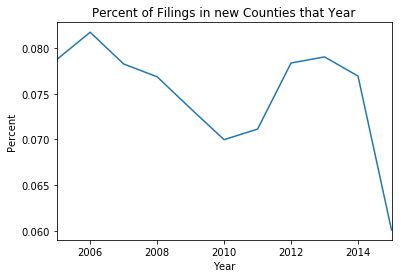

In [22]:
(returns_in.groupby("year").sum()["immigrants"] / returns_in.groupby("year").sum()["sum"]).plot()
plt.ylabel('Percent')
plt.xlabel('Year')
plt.title('Percent of Filings in new Counties that Year')

plt.show()

### Local Stats

Within local counties, how many residents are filing taxes in their county for the first time?

In [23]:
exemptions_in["newpercent"] = exemptions_in["immigrants"] / exemptions_in["sum"]
newbies2015 = exemptions_in[exemptions_in["year"] == 2015].set_index("geo_id")

county_map(newbies2015.fillna(0)["newpercent"], caption="Percent of county residents new to the county in 2015")

Within local counties, how many tax filers left to go somewhere new?

In [24]:
exemptions_out["outpercent"] = exemptions_out["emigrants"] / exemptions_in["sum"]
outies2015 = exemptions_out[exemptions_out["year"] == 2015].set_index("geo_id")

county_map(outies2015.fillna(0)["outpercent"], caption="Percent of county residents who left the county in 2015")

Of all the people who moved, where did they go?

In [25]:
newbies2015["share_of_immigrants"] = newbies2015["immigrants"] / newbies2015[newbies2015["year"] == 2015]["immigrants"].sum()

county_map(newbies2015["share_of_immigrants"], caption="Percent of all US migrants by destination")

Of all the people who moved, from where did they come?

In [26]:
outies2015["share_of_emigrants"] = outies2015["emigrants"] / exemptions_out[exemptions_out["year"] == 2015]["emigrants"].sum()

county_map(outies2015["share_of_emigrants"], caption="Percent of all US migrants by origin")

### Which counties grew and which shrank?

In [27]:
lossgain2015 = {}
for geo_id, value in (newbies2015["immigrants"] - outies2015["emigrants"]).items():
    if value < 0:
        lossgain2015[geo_id] = -1
    elif value > 0:
        lossgain2015[geo_id] = 1
    elif value == 0:
        lossgain2015[geo_id] = 0

In [28]:
county_map(pd.Series(lossgain2015), color="PuBu", caption="Population shrinkers and growers in 2015")

And by how much

In [29]:
county_map(newbies2015["newpercent"] - outies2015["outpercent"], color="RdYlGn", caption="Population growth rate in 2015")

## People and Business Together
at last

### Establishment growth rates from 2014 to 2015

In [30]:
b14 = biz[biz["year"] == 2014].set_index("geo_id")
b15 = biz[biz["year"] == 2015].set_index("geo_id")
b15["growth"] = b15["sum"] - b14["sum"]
b15["growth_percent"] = b15["growth"] / b14["sum"]

In [31]:
county_map(b15["growth_percent"], color="RdYlGn", caption="Estabishment count growth rate in 2015")

In [32]:
biz_people2015 = b15.reset_index().merge(newbies2015.reset_index(), left_on="geo_id", right_on="geo_id", how="left").fillna(0)
biz_people2015 = biz_people2015.loc[:,["geo_id", "sum_x", "growth", "growth_percent", "sum_y", "home", "immigrants", "newpercent"]]
biz_people2015.columns = ["geo_id","establishments", "new_establishments", "establishment_growth", "exemptions", "locals", "immigrants", "immigrants_percent"]
biz_people2015.head()

,geo_id,establishments,new_establishments,establishment_growth,exemptions,locals,immigrants,immigrants_percent
0,1001,844,27,0.033048,45971.0,42354.0,3617.0,0.078680
1,1003,5127,158,0.031797,163422.0,151534.0,11888.0,0.072744
2,1005,453,-11,-0.023707,18343.0,17277.0,1066.0,0.058115
3,1007,280,6,0.021898,15576.0,14762.0,814.0,0.052260
4,1009,654,-2,-0.003049,44524.0,42357.0,2167.0,0.048670


Rate of establishment growth against localized rate of immigration

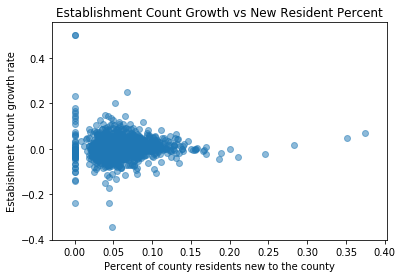

In [33]:
plt.scatter(biz_people2015["immigrants_percent"], biz_people2015["establishment_growth"], alpha=.5)

plt.title("Establishment Count Growth vs New Resident Percent")
plt.xlabel('Percent of county residents new to the county')
plt.ylabel("Estabishment count growth rate")

plt.show()

Number of new businesses against number of immigrants

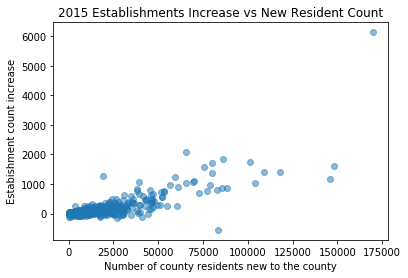

In [34]:
plt.scatter(biz_people2015["immigrants"], biz_people2015["new_establishments"], alpha=.5)

plt.title("2015 Establishments Increase vs New Resident Count")
plt.xlabel('Number of county residents new to the county')
plt.ylabel("Estabishment count increase")

plt.show()

In [35]:
outies2015simple = outies2015.reset_index().loc[:,["geo_id","emigrants"]]

In [36]:
biz_people2015 = biz_people2015.merge(outies2015simple, left_on="geo_id", right_on="geo_id", how="left").fillna(0)

In [37]:
biz_people2015.head()

,geo_id,establishments,new_establishments,establishment_growth,exemptions,locals,immigrants,immigrants_percent,emigrants
0,1001,844,27,0.033048,45971.0,42354.0,3617.0,0.078680,3329.0
1,1003,5127,158,0.031797,163422.0,151534.0,11888.0,0.072744,8958.0
2,1005,453,-11,-0.023707,18343.0,17277.0,1066.0,0.058115,1162.0
3,1007,280,6,0.021898,15576.0,14762.0,814.0,0.052260,795.0
4,1009,654,-2,-0.003049,44524.0,42357.0,2167.0,0.048670,2270.0


How about net migration versus net business change in 2015

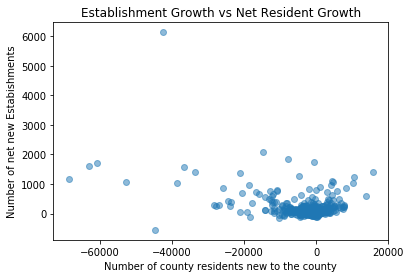

In [38]:
plt.scatter((biz_people2015["immigrants"] - biz_people2015["emigrants"]), biz_people2015["new_establishments"], alpha=0.5)


plt.title("Establishment Growth vs Net Resident Growth")
plt.xlabel('Number of county residents new to the county')
plt.ylabel("Number of net new Estabishments")

plt.show()

### Now examine the same factors over the recession and the recovery periods of 07-11 and 11-15

In [39]:
biz07 = biz07.reset_index().loc[:,["geo_id","sum"]]
biz11 = biz11.reset_index().loc[:,["geo_id","sum"]]
biz15 = biz15.reset_index().loc[:,["geo_id","sum"]]

biz_recession = biz07.merge(biz11, left_on="geo_id", right_on="geo_id", suffixes=("07","11"))
biz_recovery  = biz11.merge(biz15, left_on="geo_id", right_on="geo_id", suffixes=("11","15"))

biz_recession["change"] = biz_recession["sum11"] - biz_recession["sum07"]
biz_recovery["change"] = biz_recovery["sum15"] - biz_recovery["sum11"]

biz_recession["percent_change"] = biz_recession["change"] / biz_recession["sum07"]
biz_recovery["percent_change"] = biz_recovery["change"] / biz_recovery["sum11"]


pop07 = exemptions_in[exemptions_in["year"] == 2007].loc[:,["geo_id", "sum"]]
pop11 = exemptions_in[exemptions_in["year"] == 2011].loc[:,["geo_id", "sum"]]
pop15 = exemptions_in[exemptions_in["year"] == 2015].loc[:,["geo_id", "sum"]]

pop_recession = pop07.merge(pop11, left_on="geo_id", right_on="geo_id", suffixes=("07","11"))
pop_recovery  = pop11.merge(pop15, left_on="geo_id", right_on="geo_id", suffixes=("11","15"))

pop_recession["change"] = pop_recession["sum11"] - pop_recession["sum07"]
pop_recovery["change"] = pop_recovery["sum15"] - pop_recovery["sum11"]

pop_recession["percent_change"] = pop_recession["change"] / pop_recession["sum07"]
pop_recovery["percent_change"] = pop_recovery["change"] / pop_recovery["sum11"]

recession = biz_recession.merge(pop_recession, left_on="geo_id", right_on="geo_id", how="left", suffixes=("biz","pop"))
recovery = biz_recovery.merge(pop_recovery, left_on="geo_id", right_on="geo_id", how="left", suffixes=("biz","pop"))

In [40]:
recession.head()

,geo_id,sum07biz,sum11biz,changebiz,percent_changebiz,sum07pop,sum11pop,changepop,percent_changepop
0,1001,898,835,-63,-0.070156,44329.0,46890.0,2561.0,0.057773
1,1003,5124,4624,-500,-0.097580,127668.0,144401.0,16733.0,0.131067
2,1005,575,501,-74,-0.128696,19153.0,18490.0,-663.0,-0.034616
3,1007,338,285,-53,-0.156805,16028.0,15665.0,-363.0,-0.022648
4,1009,798,690,-108,-0.135338,41785.0,44596.0,2811.0,0.067273


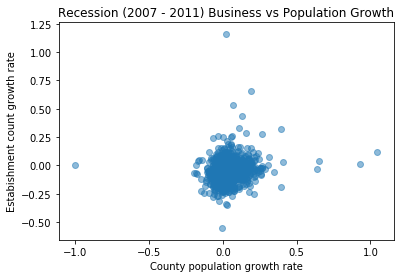

In [41]:
plt.scatter(recession["percent_changepop"], recession["percent_changebiz"], alpha=0.5)

plt.title("Recession (2007 - 2011) Business vs Population Growth")
plt.xlabel("County population growth rate")
plt.ylabel("Estabishment count growth rate")

plt.show()

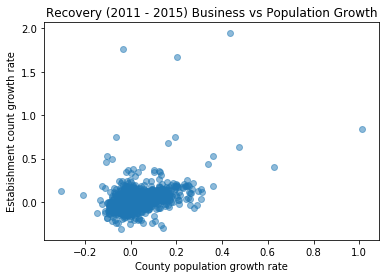

In [42]:
plt.scatter(recovery["percent_changepop"], recovery["percent_changebiz"], alpha=0.5)

plt.title("Recovery (2011 - 2015) Business vs Population Growth")
plt.xlabel("County population growth rate")
plt.ylabel("Estabishment count growth rate")

plt.show()

Looking again with the outliers excluded

### Ignoring Outliers

In [43]:
mid_80_recession = recession[recession["sum07pop"] > recession["sum07pop"].quantile(.1)][recession["sum07pop"] < recession["sum07pop"].quantile(.9)]
mid_80_recovery = recovery[recovery["sum11pop"] > recovery["sum11pop"].quantile(.1)][recovery["sum11pop"] < recovery["sum11pop"].quantile(.9)]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


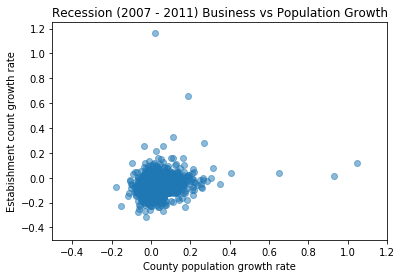

In [44]:
plt.scatter(mid_80_recession["percent_changepop"], mid_80_recession["percent_changebiz"], alpha=0.5)

plt.title("Recession (2007 - 2011) Business vs Population Growth")
plt.xlabel("County population growth rate")
plt.ylabel("Estabishment count growth rate")
plt.axis([-.5, 1.2, -.5, 1.25])


plt.show()

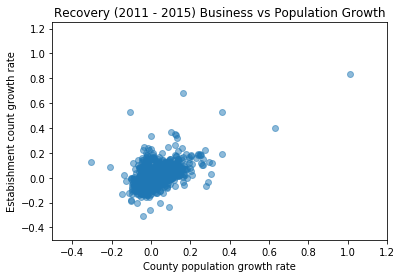

In [45]:
plt.scatter(mid_80_recovery["percent_changepop"], mid_80_recovery["percent_changebiz"], alpha=0.5)

plt.title("Recovery (2011 - 2015) Business vs Population Growth")
plt.xlabel("County population growth rate")
plt.ylabel("Estabishment count growth rate")


plt.axis([-.5, 1.2, -.5, 1.25])


plt.show()

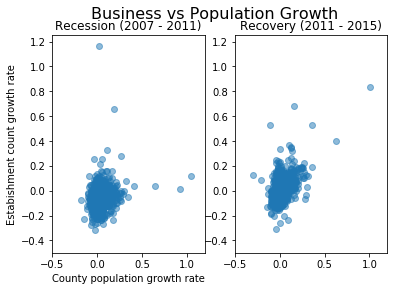

In [46]:
fig = plt.figure()
fig.suptitle("Business vs Population Growth", fontsize=16)

plt.subplot(1, 2, 1)
plt.scatter(mid_80_recession["percent_changepop"], mid_80_recession["percent_changebiz"], alpha=0.5)

plt.title("Recession (2007 - 2011)")
plt.xlabel("County population growth rate")
plt.ylabel("Estabishment count growth rate")
plt.axis([-.5, 1.2, -.5, 1.25])

plt.subplot(1,2,2)
plt.scatter(mid_80_recovery["percent_changepop"], mid_80_recovery["percent_changebiz"], alpha=0.5)
plt.title("Recovery (2011 - 2015)")

plt.axis([-.5, 1.2, -.5, 1.25])

plt.show()